In [189]:
from ClassiPyGRB import SWIFT
# Packages needed for this notebook
import os
import numpy as np

In [190]:
import torch
import torch.nn as nn
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader

In [191]:
%matplotlib inline
swift = SWIFT(root_path=r'data', res=256, n_bands=[1])
print(f"Swift/BAT bands selected: {swift.bands_selected}")

Swift/BAT bands selected: ['Time(s)', '15-25keV']


In [192]:
data_loaded = np.load(os.path.join(swift.results_path, f'SWIFT_Noise_Reduced_data_{swift.res}res_{"".join(str(b) for b in swift.n_bands)}bands_DFT_False.npz'))
grb_names, features = data_loaded['names'], data_loaded['data']
durations = swift.total_durations(grb_names, t=90)

Finding Durations: 100%|██████████████████| 1445/1445 [00:14<00:00, 102.70GRB/s]


In [193]:
print(np.mean(features,axis=1))
print(np.std(features,axis=1))

[0.00083465 0.00082683 0.00085983 ... 0.00081514 0.00087793 0.00082123]
[0.01125472 0.00857564 0.01413351 ... 0.00492775 0.01961075 0.00687175]


In [194]:
# Normalize the features here
normalized_features = (features - np.mean(features, axis=1, keepdims=1))/np.std(features,axis=1,keepdims=1)
print(normalized_features.shape)
print(np.mean(normalized_features,axis=1))
print(np.std(normalized_features,axis=1))

(1445, 4800)
[-5.92118946e-18  1.77635684e-17 -1.18423789e-17 ...  5.92118946e-17
 -5.92118946e-18 -1.18423789e-17]
[1. 1. 1. ... 1. 1. 1.]


In [195]:
_normalized_features = normalized_features # copy this so rerunning next cell doesn't throw error
_labels = np.zeros(shape=(normalized_features.shape[0],1))

In [196]:
normalized_features = torch.from_numpy(_normalized_features).to(torch.float32)
labels = torch.from_numpy(_labels).to(torch.float32)

# Check for rows with NaN values and remove them from both features and labels
mask = ~torch.isnan(normalized_features).any(dim=1) & ~torch.isnan(labels).any(dim=1)
clean_features = normalized_features[mask]
clean_labels = labels[mask]

# Split the cleaned data into training and testing sets
X_train, X_test, class_train, class_test = train_test_split(clean_features, clean_labels, test_size=0.2, random_state=205)


training_dataset = TensorDataset(X_train, class_train)
test_dataset = TensorDataset(X_test, class_test)

BATCHSIZE = 128
BATCHSIZE_TEST = 256

train_dataloader = DataLoader(training_dataset, batch_size=BATCHSIZE, shuffle=True)
test_dataloader  = DataLoader(test_dataset, batch_size=BATCHSIZE_TEST, shuffle=True)

In [197]:
INPUT_SIZE      = features.shape[1]
LATENT_SIZE     = 5
HIDDEN_SIZE     = 100

In [198]:
# Note that this code is largely from https://github.com/LSSTC-DSFP/LSSTC-DSFP-Sessions/tree/main/Sessions/Session14
# First, we will inherit from pytorch Module class; https://pytorch.org/docs/stable/generated/torch.nn.Module.html

class Encoder(nn.Module):
    def __init__(self, seed=205):
        """
        seed: int, random seed for reproducibility
        """
        super(Encoder, self).__init__()
        self.seed = torch.manual_seed(seed)
        # here we are initializing the linear layers. This registeres the layer parameters (W,b) as parameters of the Module
        self.fc1 = nn.Linear(INPUT_SIZE,HIDDEN_SIZE)
        self.fc2 = nn.Linear(HIDDEN_SIZE,LATENT_SIZE)

        # We will initialize weights following a multivariate Gaussian
        nn.init.normal_(self.fc1.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc1.bias, mean=0, std=0.01)
        nn.init.normal_(self.fc2.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc2.bias, mean=0, std=0.01)

    # this defines a forward pass of the network (="applying" the network to some input data)
    def forward(self, x):
        # print(x.dtype)
        # print(self.fc1.weight.dtype)
        # print(self.fc1.bias.dtype) # for debugging dtype mismatch
        x      = torch.nn.LeakyReLU()(self.fc1(x))
        z      = self.fc2(x)
        return z

class Decoder(nn.Module):
    def __init__(self, seed=205):
        """
        seed: int, random seed for reproducibility
        """
        super(Decoder, self).__init__()
        self.seed = torch.manual_seed(seed)
        # Using the encoder, how will you initialize two layers?
        self.fc1 = nn.Linear(LATENT_SIZE,HIDDEN_SIZE)
        self.fc2 = nn.Linear(HIDDEN_SIZE,INPUT_SIZE)

        # Using the endoer, how will you initialize the weights and biases?
        nn.init.normal_(self.fc1.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc1.bias, mean=0, std=0.01)
        nn.init.normal_(self.fc2.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc2.bias, mean=0, std=0.01)

    def forward(self, z):
        # Using the encoder, how will you define the forward pass?
        # I recommend the same activation function!
        z      = torch.nn.LeakyReLU()(self.fc1(z))
        x      = self.fc2(z)
        return x

class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        # here we are creating instances of the Encoder and Decoder class
        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        z = self.encoder(x)
        x = self.decoder(z)
        return x

In [199]:
# This creates an instance of the Autoencoder class
AE = Autoencoder()

In [200]:
# the training loop takes a function that loads the data batch by batch, a model to train, a loss function to train the model on and an optimizer
def train_loop(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    losses = []
    # iterate over the dataset
    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction of the model
        pred = model(X)
        # Compute the loss function
        loss = loss_fn(pred,X)

        # Backpropagation; this is where we take the gradient and update the network parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # here we keep track of the loss
        if batch % 10 == 0:
            loss, current = loss.item(), batch * len(X)
            losses.append(loss)
            print(f"train loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

    return losses

# the test loop is similar to the training loop, only that we don't take any gradients/don't update the network parameters, but only evaluate
def test_loop(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss =  0
    with torch.no_grad():
        for (X, y) in dataloader:
            pred = model(X)
            test_loss += loss_fn(pred, X).item()

    test_loss /= num_batches
    print(f" Avg test loss: {test_loss:>8f} \n")

    return test_loss

In [201]:
training_dataset.tensors[0].shape

torch.Size([1152, 4800])

In [202]:

torch.sum(torch.isnan(training_dataset.tensors[0]))

tensor(0)

In [203]:
training_dataset[12][0]

tensor([15.9645, 16.9614, 19.3493,  ..., -0.0517, -0.0517, -0.0517])

In [204]:
torch.sum(torch.isnan(training_dataset[12][0]))

tensor(0)

In [205]:


# Function to find indices of NaNs in a TensorDataset
def find_nan_indices_in_tensor_dataset(dataset):
    nan_indices = {}
    for i, tensors in enumerate(dataset.tensors):  # Loop through each tensor in the dataset
        nan_mask = torch.isnan(tensors)  # Get a boolean mask where True indicates NaN
        indices = torch.where(nan_mask)[0].tolist()  # Get indices of True values
        if indices:  # Only add to dict if there are NaN values
            print(i)
            print(tensors)
            print(nan_mask)
            print(torch.sum(nan_mask))
            print(torch.where(nan_mask)[0])
            nan_indices[f'Tensor {i+1}'] = indices
    return nan_indices

# Find indices of NaN values
nan_indices = find_nan_indices_in_tensor_dataset(training_dataset)

print("Indices of NaN values in the dataset:", nan_indices)

Indices of NaN values in the dataset: {}


In [206]:
EPOCHS = 200
LEARNING_RATE = 1e-3


# MeanSquaredError (L2) Loss
loss_fn         = nn.MSELoss()
# Adam Optimizer
optimizer       = torch.optim.Adam(AE.parameters(), lr=LEARNING_RATE)


train_loss = []
test_loss  = []
for t in range(EPOCHS):
    print(f"Epoch {t+1}\n-------------------------------")
    train_loss.append(train_loop(train_dataloader, AE, loss_fn, optimizer))
    test_loss.append(test_loop(test_dataloader, AE, loss_fn))
print("Done!")

Epoch 1
-------------------------------
train loss: 0.999984  [    0/ 1152]
 Avg test loss: 0.939239 

Epoch 2
-------------------------------
train loss: 0.944174  [    0/ 1152]
 Avg test loss: 0.768131 

Epoch 3
-------------------------------
train loss: 0.802408  [    0/ 1152]
 Avg test loss: 0.707258 

Epoch 4
-------------------------------
train loss: 0.661521  [    0/ 1152]
 Avg test loss: 0.624712 

Epoch 5
-------------------------------
train loss: 0.609599  [    0/ 1152]
 Avg test loss: 0.515704 

Epoch 6
-------------------------------
train loss: 0.549855  [    0/ 1152]
 Avg test loss: 0.546218 

Epoch 7
-------------------------------
train loss: 0.529991  [    0/ 1152]
 Avg test loss: 0.539342 

Epoch 8
-------------------------------
train loss: 0.507181  [    0/ 1152]
 Avg test loss: 0.500864 

Epoch 9
-------------------------------
train loss: 0.514286  [    0/ 1152]
 Avg test loss: 0.507686 

Epoch 10
-------------------------------
train loss: 0.496435  [    0/ 11

In [207]:
plot_train_loss = [x[-1] for x in train_loss]

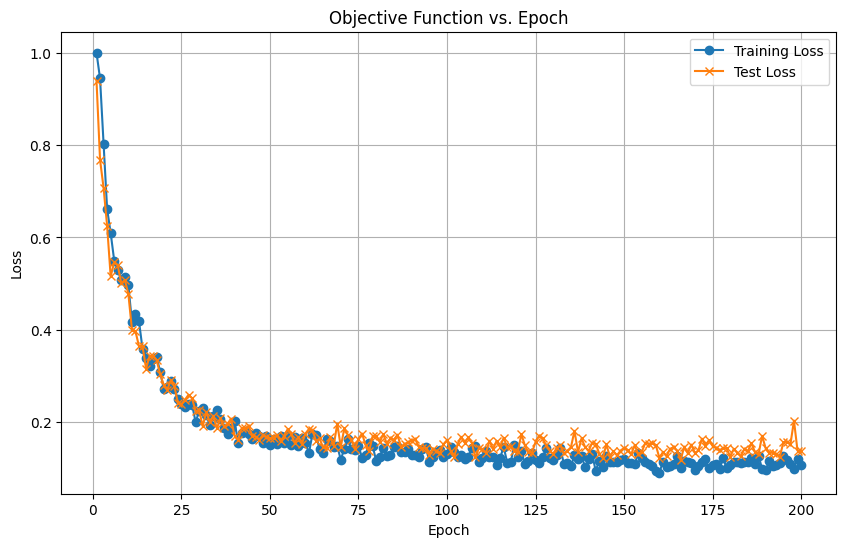

In [208]:
epochs = range(1, len(train_loss) + 1)  # Epochs are 1-based indexing

plt.figure(figsize=(10, 6))
plt.plot(epochs, plot_train_loss, label='Training Loss', marker='o')
plt.plot(epochs, test_loss, label='Test Loss', marker='x')
plt.title('Objective Function vs. Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [209]:
os.getcwd()

'/Users/jeqcho/astro-205/grb'

In [249]:
nr = True
dft = False

fname = "Autoencoder_"
if nr:
    fname += "Noise_Reduced_"
fname += f"{swift.res}res_"
fname += f'{"".join(str(b) for b in swift.n_bands)}bands_'
if dft:
    fname += f'DFT_'


torch.save(AE.state_dict(), f'{fname}state_dict.pth')
# torch.save(AE, f'{fname}.pth')
print(f"Model saved to  f'{fname}state_dict.pth")

Model saved to  f'Autoencoder_Noise_Reduced_256res_1bands_state_dict.pth


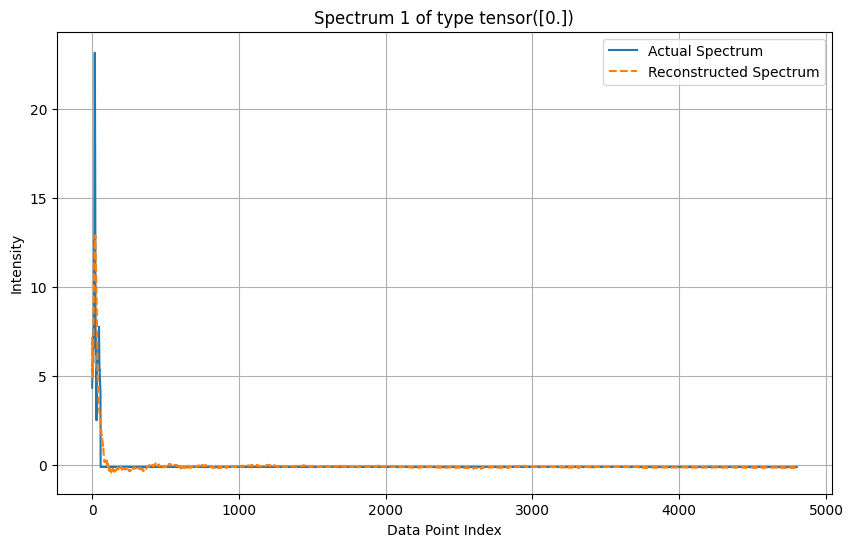

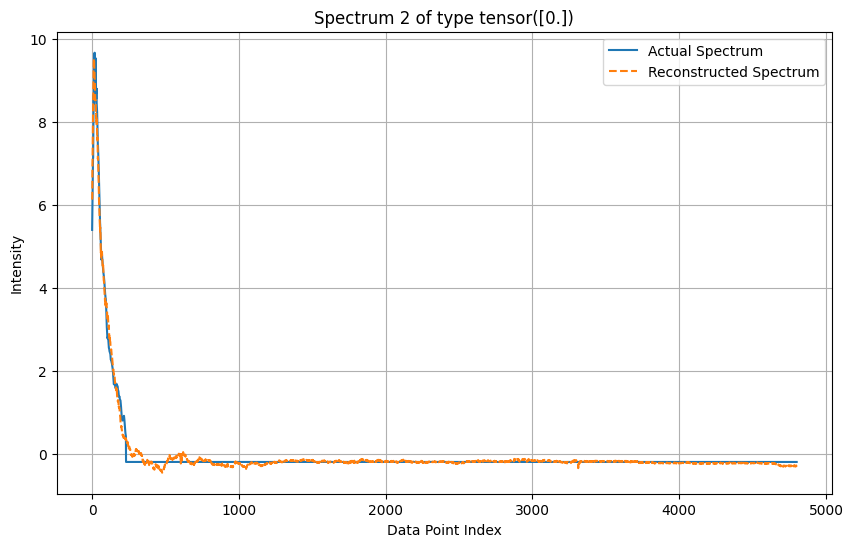

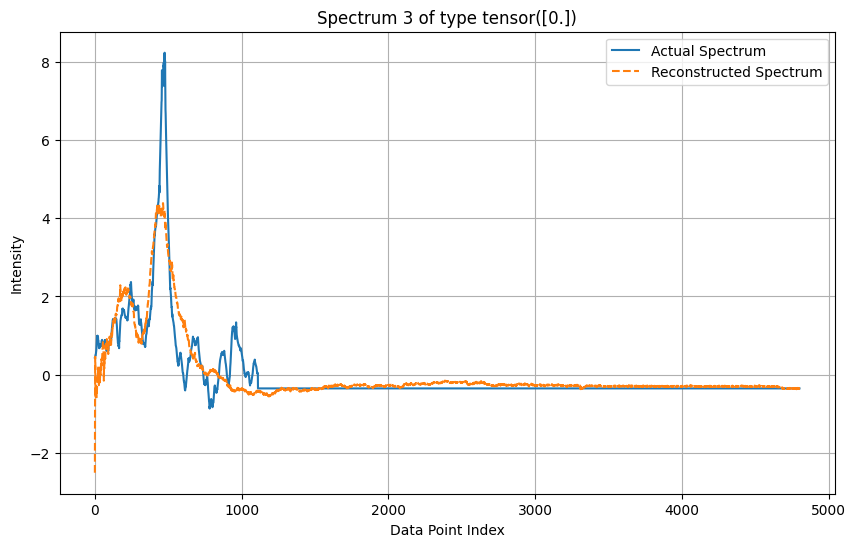

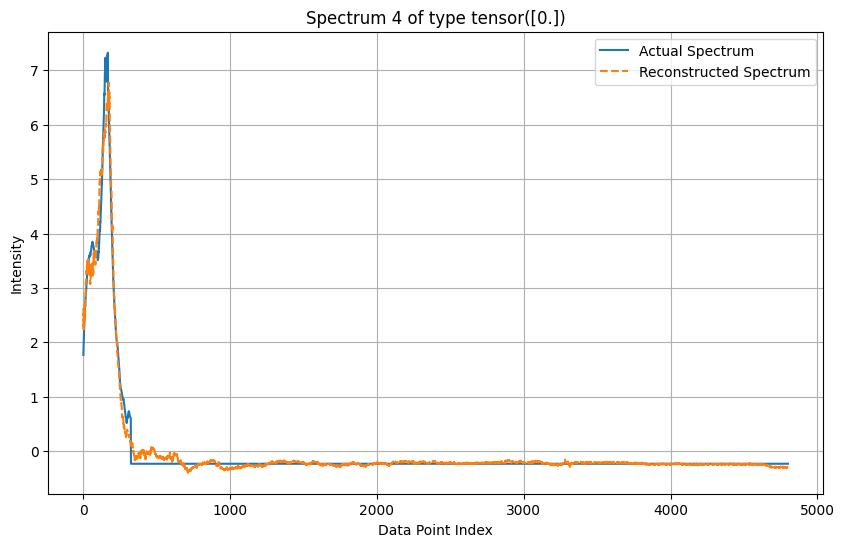

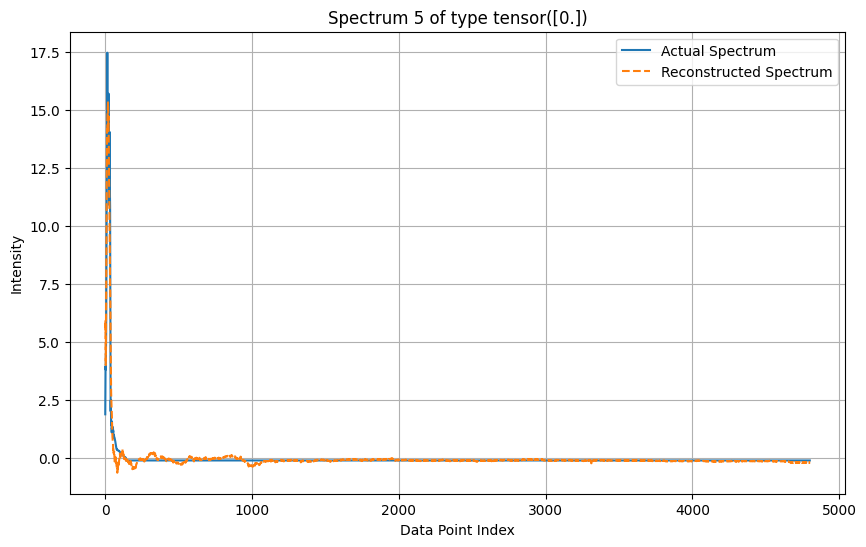

...

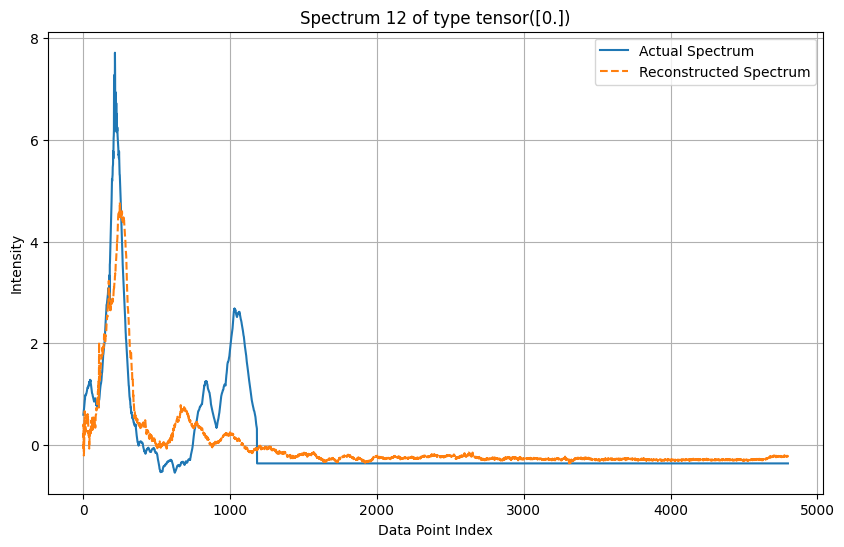

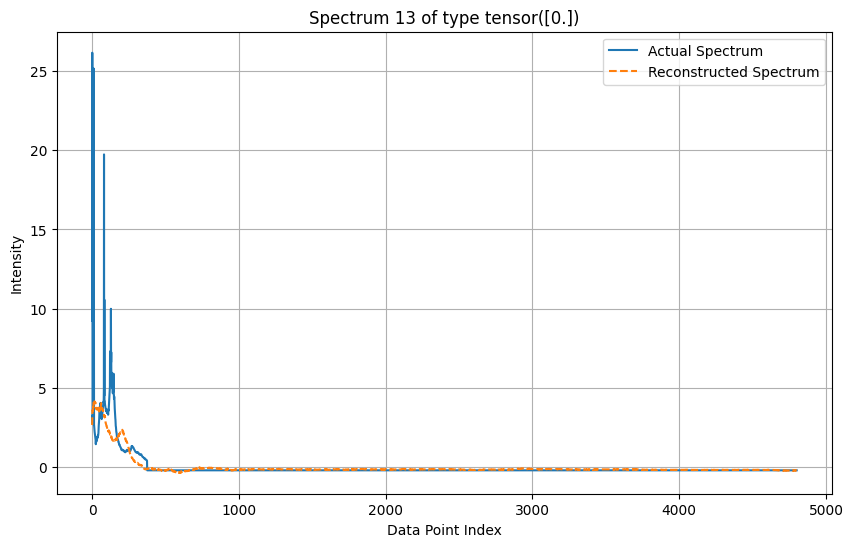

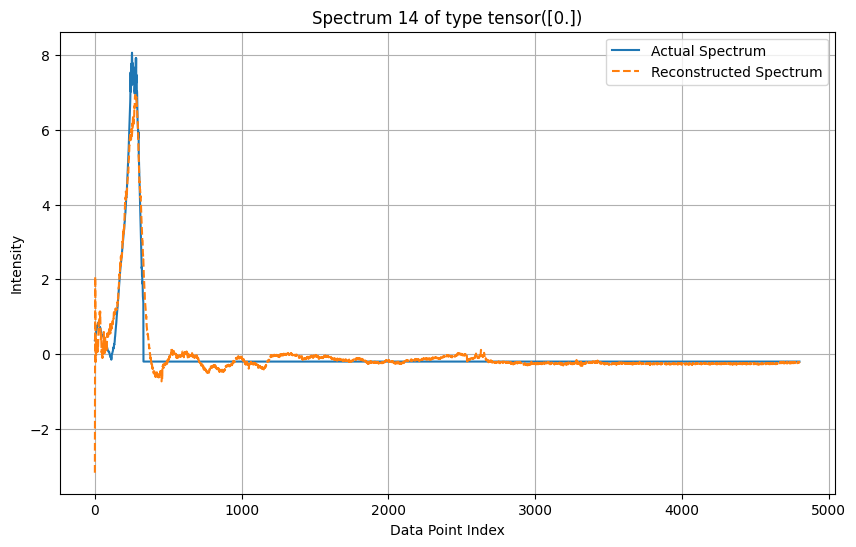

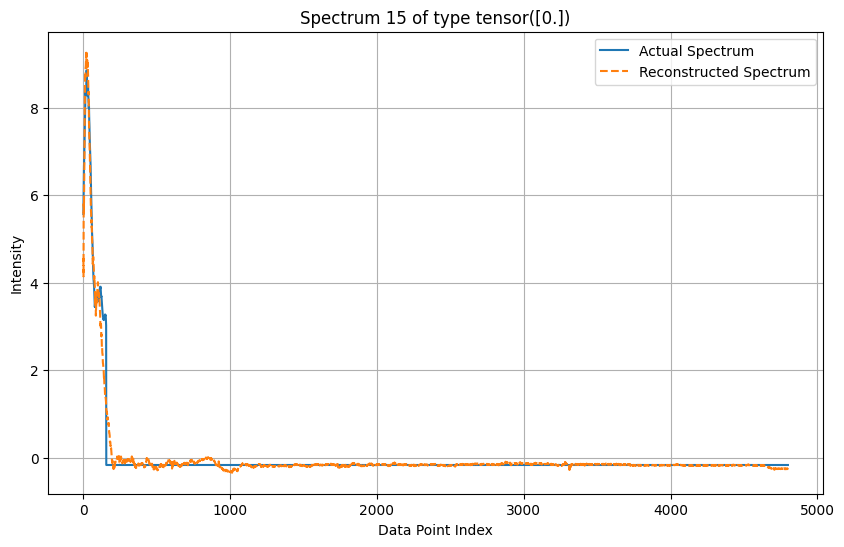

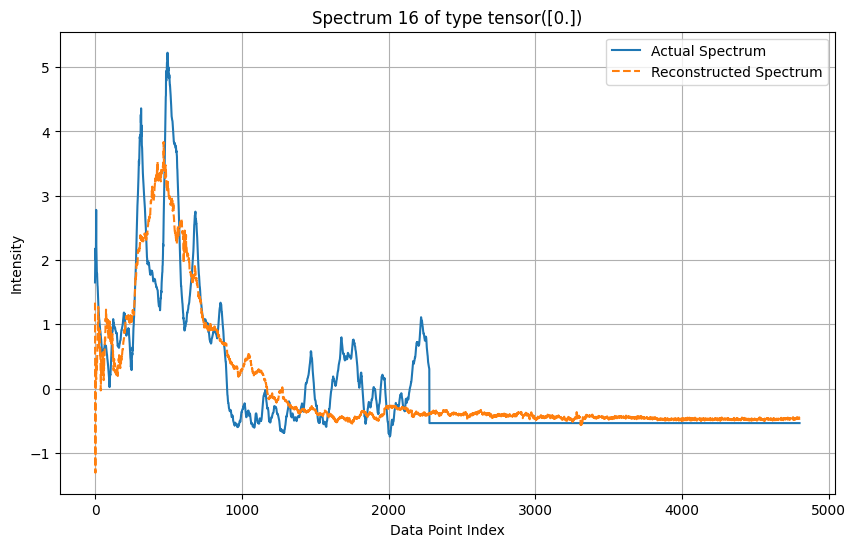

In [211]:
vis_loader = DataLoader(test_dataset, batch_size=16, shuffle=True) # get 16 random spectra

for X_batch, y_batch in vis_loader:
    # Simulated x-axis values for the spectrum
    x = np.linspace(0, features.shape[1], features.shape[1])
    
    with torch.no_grad():
        preds = AE(X_batch).detach()
    
    for i in range(len(X_batch)):
        plt.figure(figsize=(10, 6))
        plt.plot(x, X_batch[i].numpy(), label='Actual Spectrum')  # Converting tensor to numpy array for plotting
        plt.plot(x, preds[i].numpy(), label='Reconstructed Spectrum',linestyle='--')
        plt.title(f'Spectrum {i+1} of type {y_batch[i]}')
        plt.xlabel('Data Point Index')
        plt.ylabel('Intensity')
        plt.legend()
        plt.grid(True)
    break # just need one batch of 16

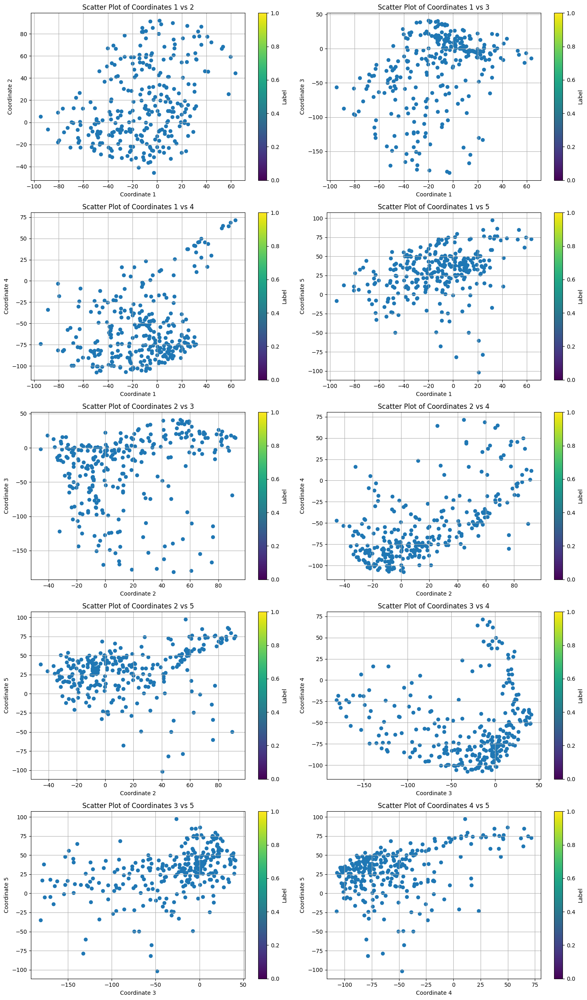

In [212]:
preds = []
labls = []
for X_batch, y_batch in test_dataloader:
    with torch.no_grad():
        preds.append(AE.encoder(X_batch).detach())
        labls += y_batch

preds = torch.cat(preds)

import itertools

# Assuming `preds` is your 5-dimensional encoded tensor
# Example: preds = torch.randn(100, 5)  # Random data for illustration

# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(itertools.combinations(range(5), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=(15, 25))  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds[:, idx1].numpy(), preds[:, idx2].numpy())
    ax.set_title(f'Scatter Plot of Coordinates {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Coordinate {idx1+1}')
    ax.set_ylabel(f'Coordinate {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

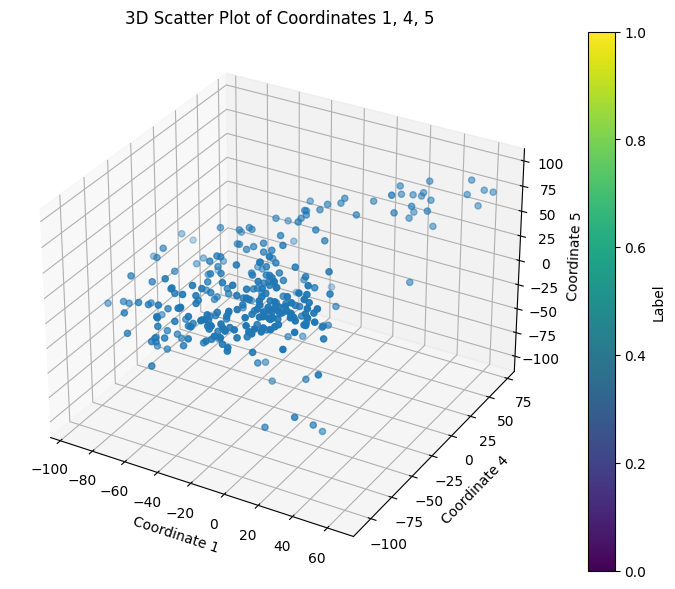

In [213]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create a scatter plot
scatter = ax.scatter(preds[:, 0].numpy(), preds[:, 3].numpy(), preds[:, 4].numpy())

# Add labels and title
ax.set_xlabel('Coordinate 1')
ax.set_ylabel('Coordinate 4')
ax.set_zlabel('Coordinate 5')
ax.set_title('3D Scatter Plot of Coordinates 1, 4, 5')

# Add a color bar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Label')

plt.show()

In [214]:
preds_=preds

In [215]:
from sklearn.cluster import KMeans

encoded = preds_
kmeans = KMeans(n_clusters=2, random_state=205).fit(encoded)
kmeans

KMeans(n_clusters=2, random_state=205)

In [216]:
print(kmeans.cluster_centers_)

[[ 4.45448522e-03  2.12643416e+01  2.40539416e+00 -5.27301211e+01
   4.04003318e+01]
 [-3.47769118e+01  5.47502553e+00 -8.93423350e+01 -6.25986769e+01
   9.02809487e+00]]


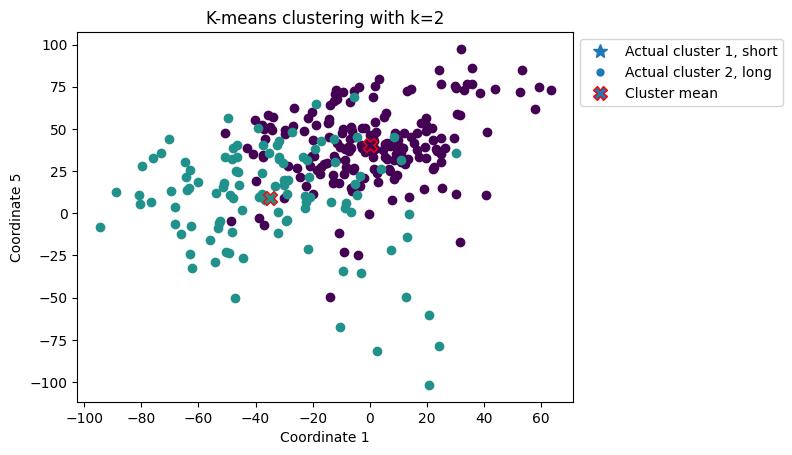

In [217]:
from matplotlib.lines import Line2D      

ax = plt.subplot(1,1,1)
labls_array = np.array([label.item() for label in labls])
description = ['short','long']

# Use the viridis colormap
colormap = plt.cm.viridis

num_classes = len(description)

# Normalize label values to match the colormap range
normalize = plt.Normalize(vmin=0, vmax=num_classes)

markers = ['*', '.']


for pred_class in range(num_classes):
    total_mask = kmeans.labels_ == pred_class
    ax.scatter(encoded[total_mask,0], encoded[total_mask,4], 
               color=colormap(normalize(pred_class)))

# cluster center
for idx, center in enumerate(kmeans.cluster_centers_):
    ax.scatter(center[0],center[4], color=colormap(normalize(idx)), marker='X', s=100, edgecolors='red')
    
ax.set_xlabel('Coordinate 1')
ax.set_ylabel('Coordinate 5')
ax.set_title("K-means clustering with k=2")
legend_elements = [Line2D([0], [0], marker=markers[i-1], linewidth=0, label=f'Actual cluster {i}, {description[i-1]}',
                           markersize=10) for i in range(1, num_classes+1)]
legend_elements.append(Line2D([0], [0], marker='X', linewidth=0, label=f'Cluster mean',
                           markersize=10,markeredgecolor='red'))
ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

In [218]:
bat = []
for X_batch, y_batch in test_dataloader:
    bat.append(X_batch)

bat = torch.concat(bat)
bat

tensor([[ 8.1327e-01,  9.5747e-01,  1.0954e+00,  ..., -2.2139e-01,
         -2.2139e-01, -2.2139e-01],
        [ 3.5448e+00,  3.6800e+00,  3.7779e+00,  ..., -2.6752e-01,
         -2.6752e-01, -2.6752e-01],
        [ 1.5035e+00,  1.5860e+00,  1.6611e+00,  ..., -3.1003e-01,
         -3.1003e-01, -3.1003e-01],
        ...,
        [ 3.7241e-01,  4.0705e-01,  4.3773e-01,  ..., -1.9709e-01,
         -1.9709e-01, -1.9709e-01],
        [ 1.5998e+01,  5.2930e+01,  2.9916e+01,  ..., -5.1974e-02,
         -5.1974e-02, -5.1974e-02],
        [ 4.3688e+00,  4.6031e+00,  4.8332e+00,  ..., -1.6201e-01,
         -1.6201e-01, -1.6201e-01]])

In [219]:
torch.mean(bat[:,0])

tensor(5.8520)

In [220]:
bat2 = []
for X_batch, y_batch in train_dataloader:
    bat2.append(X_batch)

bat2 = torch.concat(bat2)
bat2

tensor([[ 0.3926,  0.4499,  0.4916,  ..., -0.1896, -0.1896, -0.1896],
        [ 3.3626,  3.5314,  3.6949,  ..., -0.4038, -0.4038, -0.4038],
        [ 4.1659,  4.4952,  4.8706,  ..., -0.1994, -0.1994, -0.1994],
        ...,
        [ 4.4548,  4.6404,  4.8262,  ..., -0.1226, -0.1226, -0.1226],
        [ 9.4882,  9.7302,  9.8642,  ..., -0.0813, -0.0813, -0.0813],
        [ 7.4078,  7.6717,  7.7483,  ..., -0.1935, -0.1935, -0.1935]])

In [221]:
torch.mean(bat2[:,0])

tensor(5.7961)

In [222]:
preds2 = []
for x in features:
    with torch.no_grad():
        # Convert x from a NumPy array to a PyTorch tensor
        x_tensor = torch.tensor(x, dtype=torch.float32)
        
        # Add a batch dimension to x
        x_tensor = x_tensor.unsqueeze(0)
        preds2.append(AE.encoder(x_tensor).detach())

preds2 = torch.cat(preds2)
preds2

tensor([[-0.3376,  0.6952,  0.8299, -0.6432,  0.4880],
        [-0.0882,  0.4413,  0.5411, -0.7401,  0.2726],
        [ 0.0419,  1.2245,  0.7684, -0.1028,  1.0546],
        ...,
        [-0.1161, -0.0612,  0.2985, -0.6414,  0.0785],
        [-0.0471,  1.8871,  0.6984,  0.1114,  1.4123],
        [ 0.0340, -0.0126,  0.2705, -0.6562,  0.2300]])

In [223]:
for X_batch, y_batch in test_dataloader:
    with torch.no_grad():
        print(X_batch.shape)
        print(AE.encoder(X_batch).detach())
        # preds.append(AE.encoder(X_batch).detach())
        # labls += y_batch

torch.Size([256, 4800])
tensor([[  19.1004,   16.1023,  -12.5735,  -90.3199,   14.4693],
        [ -50.3506,   -1.5562,  -95.0423,  -72.7335,  -23.0638],
        [ -80.7709,  -17.8083,  -95.6966,   -3.2615,   10.8093],
        ...,
        [  -4.2598,   62.5684,   11.4695,  -38.6398,  -24.4486],
        [ -22.7292,   -7.7405, -128.5623,  -73.2964,   10.5448],
        [  -9.1841,   -0.2036,   -4.2247, -105.4632,   23.2694]])
torch.Size([33, 4800])
tensor([[ 1.2472e+00, -8.0119e+00, -3.4878e+00, -9.6804e+01,  3.3552e+01],
        [ 7.3298e+00,  3.1888e+01, -7.4400e+01, -1.9808e+01, -2.2007e+01],
        [-6.4080e+00,  2.7190e+01, -6.7028e+01, -6.4926e+01,  7.6848e-01],
        [-1.4370e+01,  6.1054e+01,  3.1235e+01, -3.7661e+01,  5.6100e+01],
        [-3.6980e+01,  5.3611e+01,  1.4960e+01, -5.2583e+01,  4.9825e+01],
        [-5.2752e+01, -8.1951e+00, -4.5640e+01, -1.0078e+02, -5.9952e+00],
        [-8.7420e+00,  5.1939e+01,  3.5263e+01, -5.2033e+01,  3.8336e+01],
        [-5.0786e+00,  6

In [224]:
for X, y_batch in test_dataset:
    with torch.no_grad():
        # Convert x from a NumPy array to a PyTorch tensor
        x_tensor = torch.tensor(X, dtype=torch.float32)
        
        # Add a batch dimension to x
        x_tensor = x_tensor.unsqueeze(0)
        print(AE.encoder(x_tensor).detach())
        # print(X_batch.shape)
        # print(AE.encoder(X_batch).detach())

tensor([[-14.5799,   3.9447, -12.8601, -81.3327,  53.5829]])
tensor([[ -46.1809,   -8.6285,  -44.7562, -105.5179,   24.4246]])
tensor([[ -21.5577,   -8.6564,  -34.7501, -103.4807,   32.2940]])
tensor([[-10.4319,  -6.9975, -12.7028, -93.5635,  39.3241]])
tensor([[-52.4202, -19.1914, -16.4974, -97.8310,  -4.8319]])
tensor([[  5.8066,  68.4415,   8.1026, -15.8144,  59.3449]])
tensor([[ 22.2269,  19.4189,  12.7683, -72.5161,  26.3502]])
tensor([[ 23.5098, -26.0858, -37.6150, -45.0726,  36.6455]])
tensor([[35.8579, 86.4967,  0.7355, 49.6173, 86.3098]])
tensor([[ 11.8364,   9.4772,  -3.2928, -71.0793,  47.6318]])
tensor([[13.1980, 60.8749, 18.9943,  6.8508, 72.2185]])
tensor([[-75.7840,  -9.0231, -42.7504, -80.7775,  33.0166]])
tensor([[ 19.6763, -27.5760, -13.1725, -64.2892,  48.5130]])
tensor([[ 19.8664,  54.3298,  22.2460, -38.9983,  52.2226]])
tensor([[-11.6493, -31.2570,   6.1793, -75.9437,  31.8197]])
tensor([[-34.8388,  52.2221,  20.1612, -35.4355,  50.8555]])
tensor([[-70.4294, -22.7

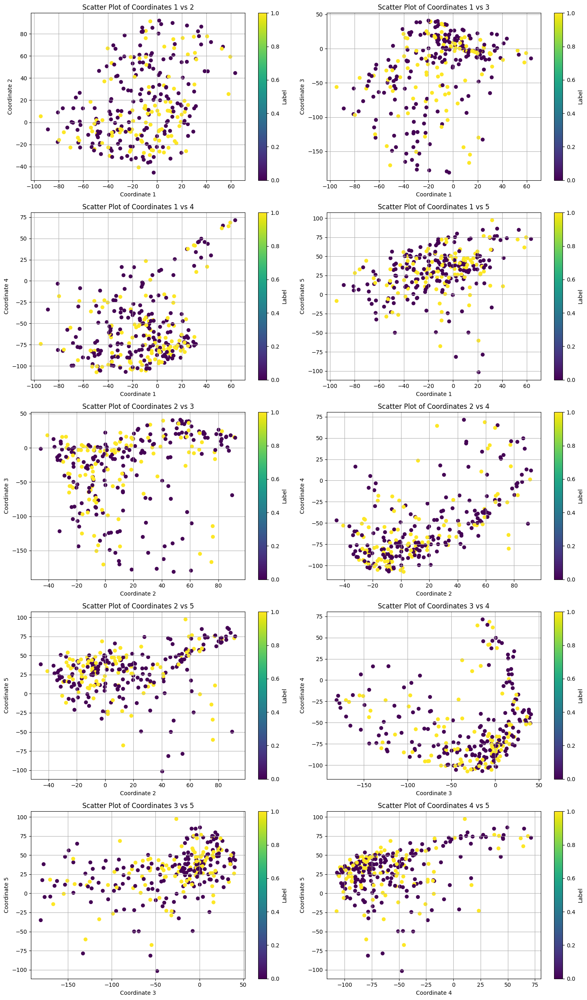

In [225]:
preds = []
labls = []
for X_batch, y_batch in test_dataloader:
    with torch.no_grad():
        preds.append(AE.encoder(X_batch).detach())
        labls += y_batch

preds = torch.cat(preds)

import itertools

# Assuming `preds` is your 5-dimensional encoded tensor
# Example: preds = torch.randn(100, 5)  # Random data for illustration

# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(itertools.combinations(range(5), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=(15, 25))  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds[:, idx1].numpy(), preds[:, idx2].numpy(), c=kmeans.labels_, cmap='viridis')
    ax.set_title(f'Scatter Plot of Coordinates {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Coordinate {idx1+1}')
    ax.set_ylabel(f'Coordinate {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

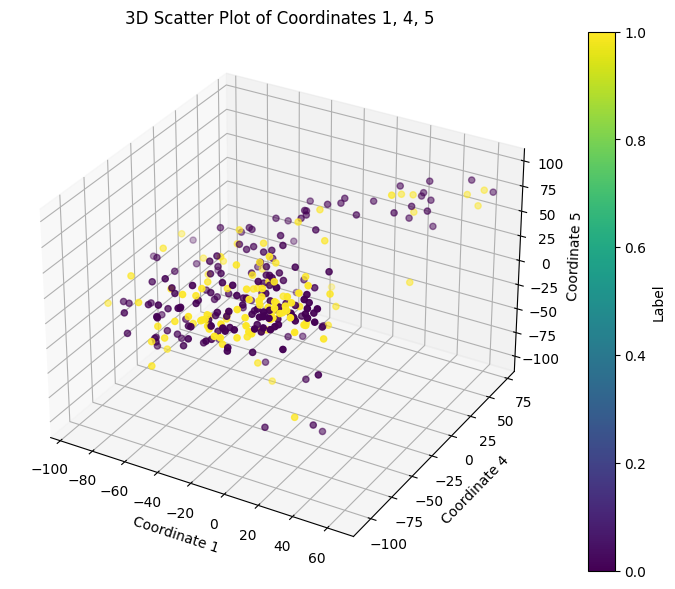

In [226]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create a scatter plot
scatter = ax.scatter(preds[:, 0].numpy(), preds[:, 3].numpy(), preds[:, 4].numpy(), c=kmeans.labels_, cmap='viridis')

# Add labels and title
ax.set_xlabel('Coordinate 1')
ax.set_ylabel('Coordinate 4')
ax.set_zlabel('Coordinate 5')
ax.set_title('3D Scatter Plot of Coordinates 1, 4, 5')

# Add a color bar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Label')

plt.show()

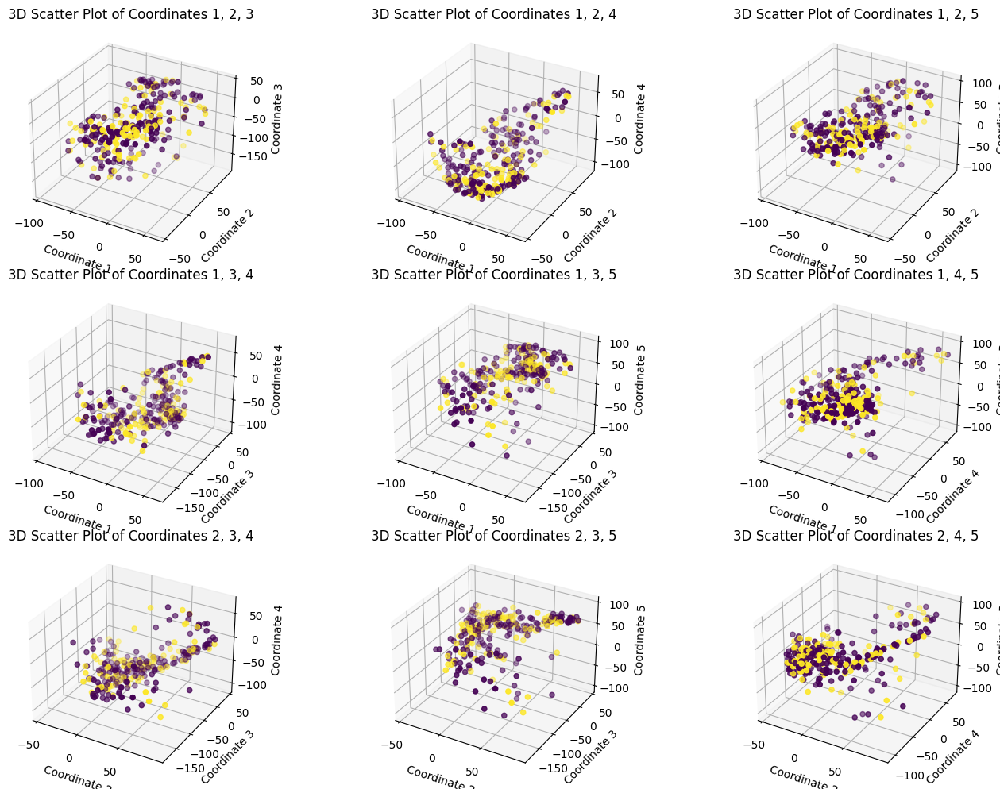

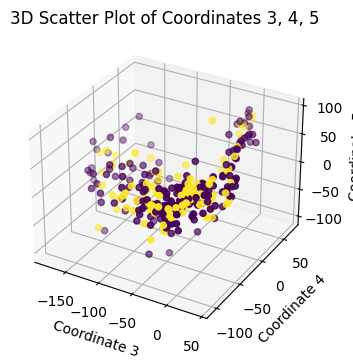

In [227]:
from itertools import combinations

# Get all permutations of three columns out of five (0-based indices)
perms = list(combinations(range(5), 3))

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                scatter = ax.scatter(preds[:, x], preds[:, y], preds[:, z], c=kmeans.labels_, cmap='viridis')
                ax.set_xlabel(f'Coordinate {x+1}')
                ax.set_ylabel(f'Coordinate {y+1}')
                ax.set_zlabel(f'Coordinate {z+1}')
                ax.set_title(f'3D Scatter Plot of Coordinates {x+1}, {y+1}, {z+1}')

        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure

In [228]:
features

array([[0.13314511, 0.14474098, 0.15055469, ..., 0.        , 0.        ,
        0.        ],
       [0.08352326, 0.08666602, 0.08958159, ..., 0.        , 0.        ,
        0.        ],
       [0.38796521, 0.39552123, 0.34558339, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01029709, 0.01351258, 0.01387183, ..., 0.        , 0.        ,
        0.        ],
       [0.2988985 , 0.62277582, 0.64772135, ..., 0.        , 0.        ,
        0.        ],
       [0.02912177, 0.03019724, 0.03149723, ..., 0.        , 0.        ,
        0.        ]])

In [229]:
preds2 = []
for x in normalized_features:
    with torch.no_grad():
        # Convert x from a NumPy array to a PyTorch tensor
        x_tensor = torch.tensor(x, dtype=torch.float32)
        
        # Add a batch dimension to x
        x_tensor = x_tensor.unsqueeze(0)
        preds2.append(AE.encoder(x_tensor).detach())

preds2 = torch.cat(preds2)
preds2

tensor([[-23.3828,  57.2702,  38.5152, -42.2311,  48.4872],
        [  0.4520,  43.1728,  12.8891, -67.4904,  38.0507],
        [ 14.4032,  78.1099,  24.1325,   9.1077,  81.1417],
        ...,
        [  5.9368,  -8.1794, -16.8957, -96.2935,  32.4139],
        [  5.6569,  90.3320,  13.7668,  17.1214,  76.8035],
        [ 27.1586,  -1.7137, -16.0721, -73.0287,  44.6801]])

In [230]:
mask = ~torch.isnan(preds2).any(dim=1)
preds2 = preds2[mask]

In [231]:
encoded2 = preds2
kmeans2 = KMeans(n_clusters=2, random_state=205).fit(encoded2)
kmeans2

KMeans(n_clusters=2, random_state=205)

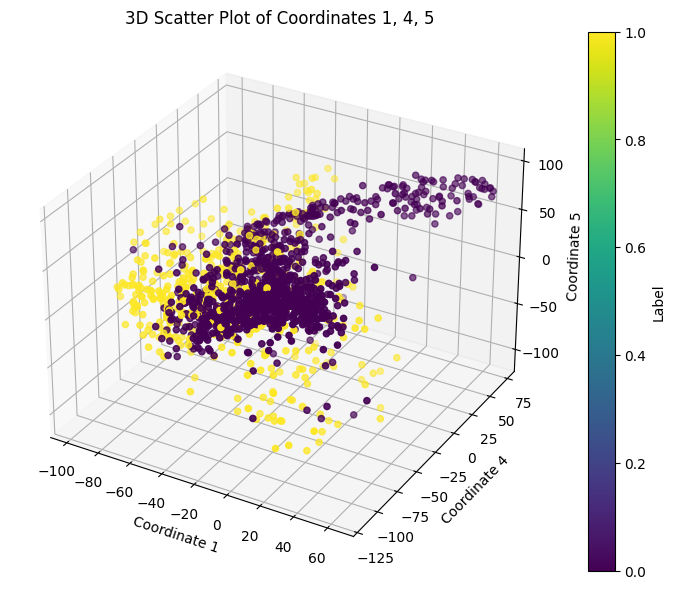

In [232]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create a scatter plot
scatter = ax.scatter(preds2[:, 0].numpy(), preds2[:, 3].numpy(), preds2[:, 4].numpy(), c=kmeans2.labels_, cmap='viridis')

# Add labels and title
ax.set_xlabel('Coordinate 1')
ax.set_ylabel('Coordinate 4')
ax.set_zlabel('Coordinate 5')
ax.set_title('3D Scatter Plot of Coordinates 1, 4, 5')

# Add a color bar
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Label')

plt.show()

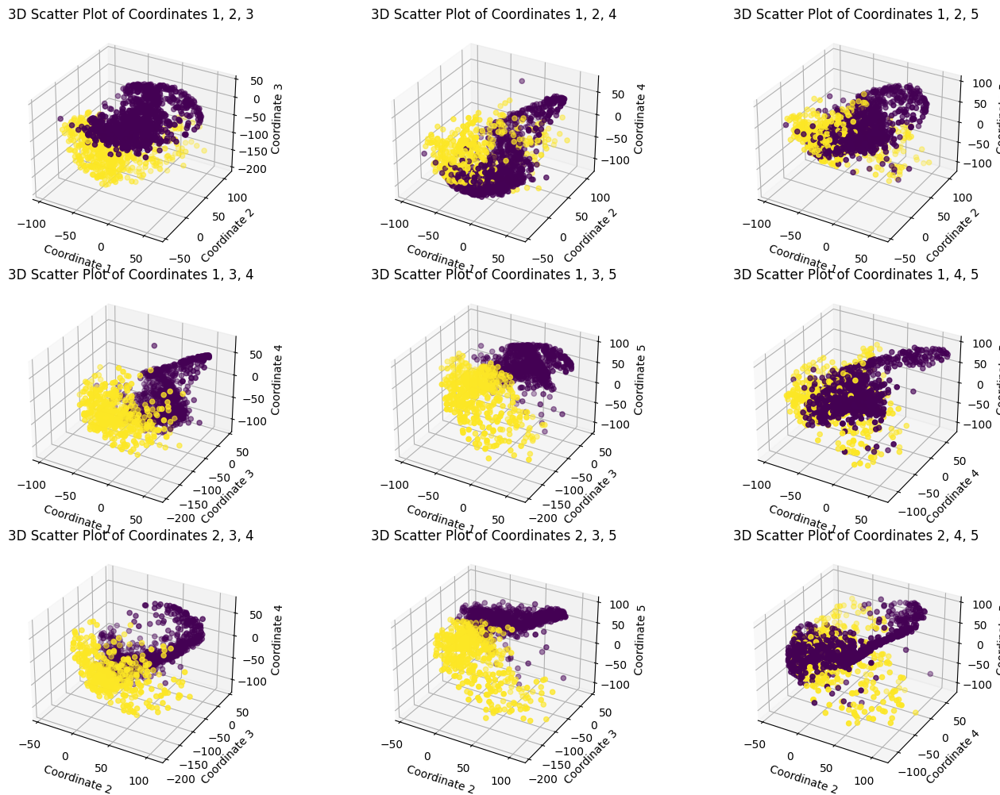

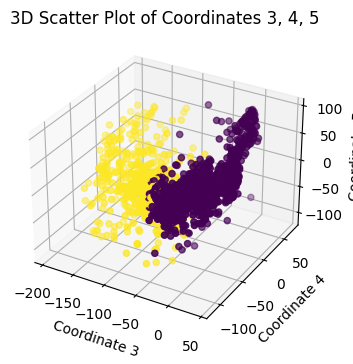

In [233]:
# Get all permutations of three columns out of five (0-based indices)
perms = list(combinations(range(5), 3))

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                scatter = ax.scatter(preds2[:, x], preds2[:, y], preds2[:, z], c=kmeans2.labels_, cmap='viridis')
                ax.set_xlabel(f'Coordinate {x+1}')
                ax.set_ylabel(f'Coordinate {y+1}')
                ax.set_zlabel(f'Coordinate {z+1}')
                ax.set_title(f'3D Scatter Plot of Coordinates {x+1}, {y+1}, {z+1}')

        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure

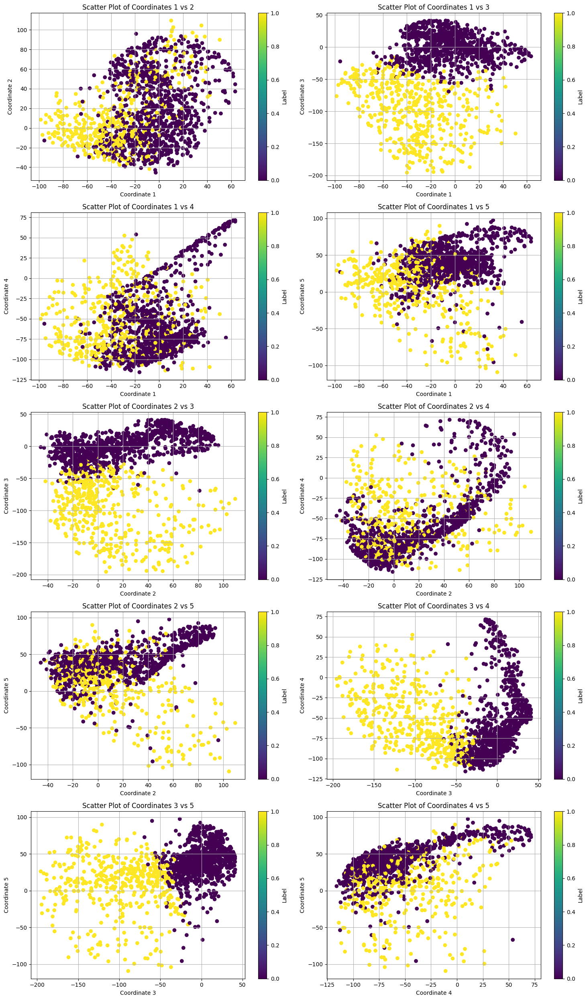

In [234]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(itertools.combinations(range(5), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=(15, 25))  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds2[:, idx1].numpy(), preds2[:, idx2].numpy(), c=kmeans2.labels_, cmap='viridis')
    ax.set_title(f'Scatter Plot of Coordinates {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Coordinate {idx1+1}')
    ax.set_ylabel(f'Coordinate {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

In [235]:
data_loaded = np.load(os.path.join(swift.results_path, f'SWIFT_data_{swift.res}res_{"".join(str(b) for b in swift.n_bands)}bands_DFT_True.npz'))
names_64ms, features_64ms = data_loaded['names'], data_loaded['data']

In [236]:
names_64ms = names_64ms[mask]

Finding Durations: 100%|█████████████████████| 974/974 [00:10<00:00, 90.87GRB/s]


Text(0, 0.5, 'Number of GRBs')

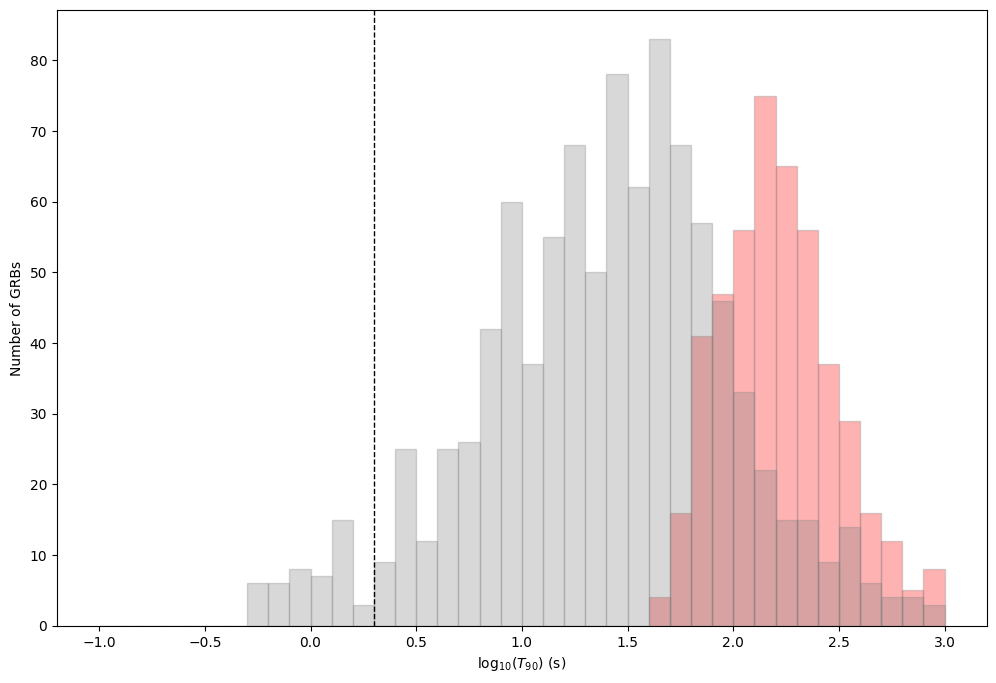

In [237]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
match = kmeans2.labels_==1
match2 = kmeans2.labels_==0
names1 = names_64ms[match]
names2 = names_64ms[match2]
swift.duration_histogram(names=[names1, names2], alpha=0.3, color_groups=['r', 'gray'], ax=ax)
ax.axvline(x=np.log10(2), c='k', ls='--', linewidth=1)
ax.set_xlabel(r'log$_{10}(T_{90})$ (s)')
ax.set_ylabel('Number of GRBs')

In [238]:
fname = f'autoencoded_nr_{swift.res}res_{"".join(str(b) for b in swift.n_bands)}bands_DFT_True.pt'
torch.save(preds2, fname)

In [239]:
durations[mask].shape

(1441,)

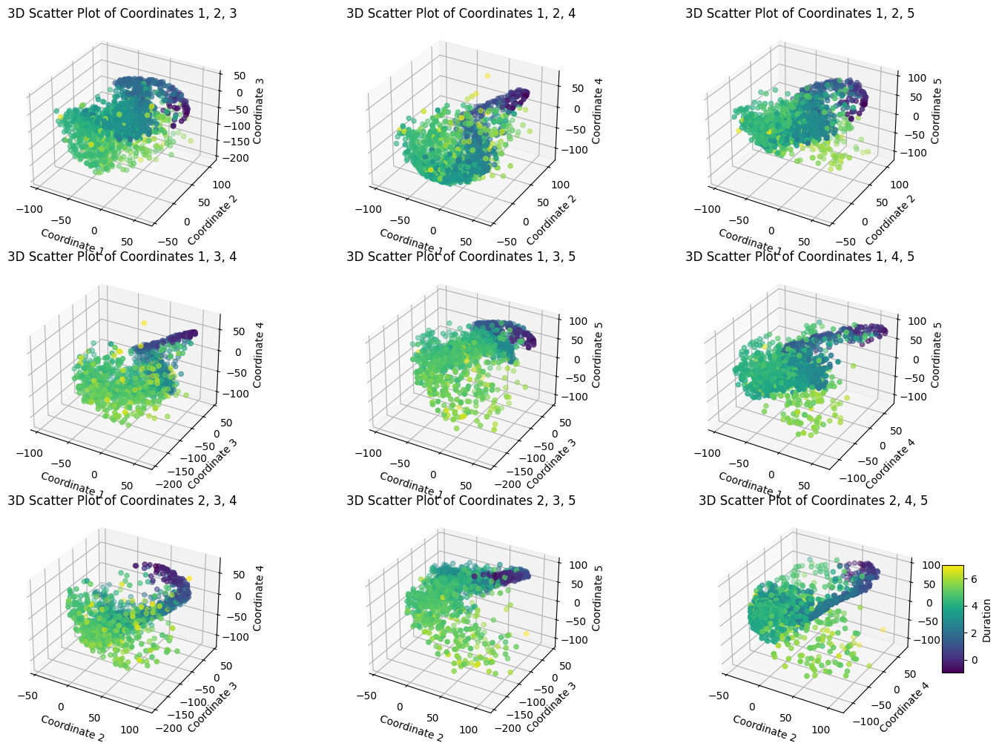

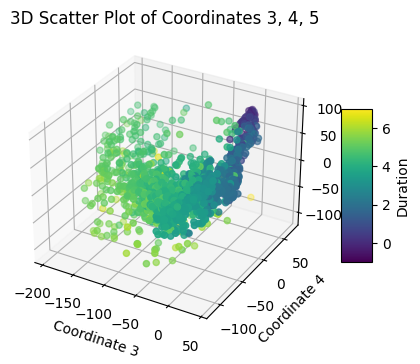

In [240]:
# Get all permutations of three columns out of five (0-based indices)
perms = list(combinations(range(5), 3))

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                # Use durations for coloring
                scatter = ax.scatter(preds2[:, x], preds2[:, y], preds2[:, z], c=np.log(durations[mask]), cmap='viridis')
                ax.set_xlabel(f'Coordinate {x+1}')
                ax.set_ylabel(f'Coordinate {y+1}')
                ax.set_zlabel(f'Coordinate {z+1}')
                ax.set_title(f'3D Scatter Plot of Coordinates {x+1}, {y+1}, {z+1}')
        plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='Duration')  # Add a colorbar with label
        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure


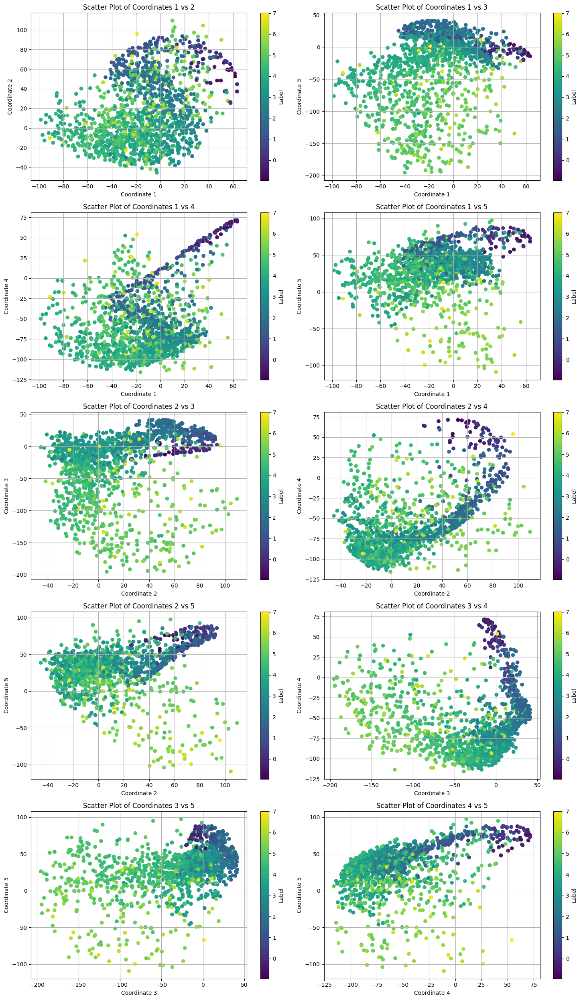

In [241]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(itertools.combinations(range(5), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=(15, 25))  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds2[:, idx1].numpy(), preds2[:, idx2].numpy(), c=np.log(durations[mask]), cmap='viridis')
    ax.set_title(f'Scatter Plot of Coordinates {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Coordinate {idx1+1}')
    ax.set_ylabel(f'Coordinate {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

In [242]:
import numpy as np


# Exploring the array
print("Shape of the array:", durations[mask].shape)
print("Data type of the array:", durations[mask].dtype)
print("Number of dimensions:", durations[mask].ndim)
print("Total number of elements:", durations[mask].size)

# Describing the durations[mask]
print("Mean of the array:", np.mean(durations[mask]))
print("Standard deviation:", np.std(durations[mask]))
print("Minimum value:", np.min(durations[mask]))
print("Maximum value:", np.max(durations[mask]))
print("25th percentile:", np.percentile(durations[mask], 25))
print("Median:", np.median(durations[mask]))
print("75th percentile:", np.percentile(durations[mask], 75))
print("90th percentile:", np.percentile(durations[mask], 90))
print("95th percentile:", np.percentile(durations[mask], 95))
print("99th percentile:", np.percentile(durations[mask], 99))

Shape of the array: (1441,)
Data type of the array: float64
Number of dimensions: 1
Total number of elements: 1441
Mean of the array: 79.58275086745316
Standard deviation: 109.06124544991424
Minimum value: 0.384
Maximum value: 1104.7520000000002
25th percentile: 14.047999999999998
Median: 44.328
75th percentile: 102.316
90th percentile: 186.504
95th percentile: 273.568
99th percentile: 551.3743999999996


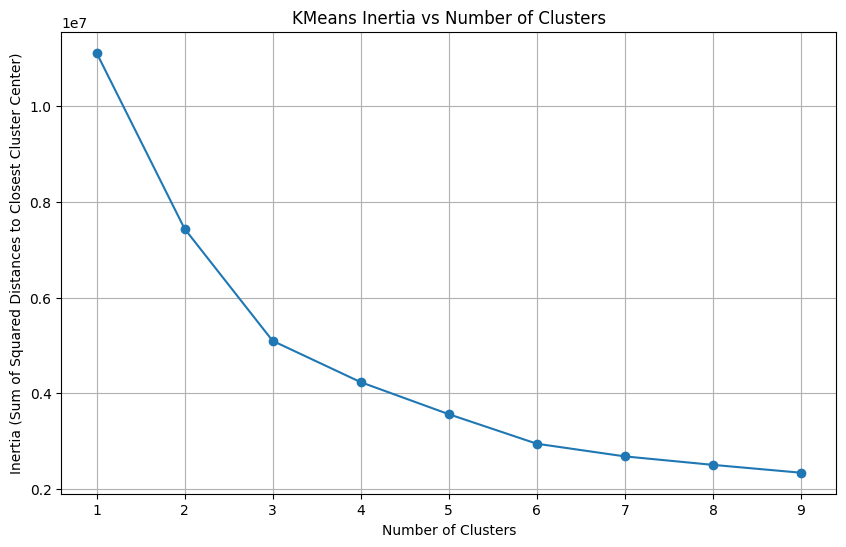

In [243]:
# Try different numbers of clusters
num_clusters = range(1, 10)  # You can adjust the range as needed
inertias = []

for k in num_clusters:
    kmeans = KMeans(n_clusters=k, random_state=205)
    kmeans.fit(encoded2)
    inertias.append(kmeans.inertia_)

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(num_clusters, inertias, marker='o')
plt.title('KMeans Inertia vs Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances to Closest Cluster Center)')
plt.grid(True)
plt.show()

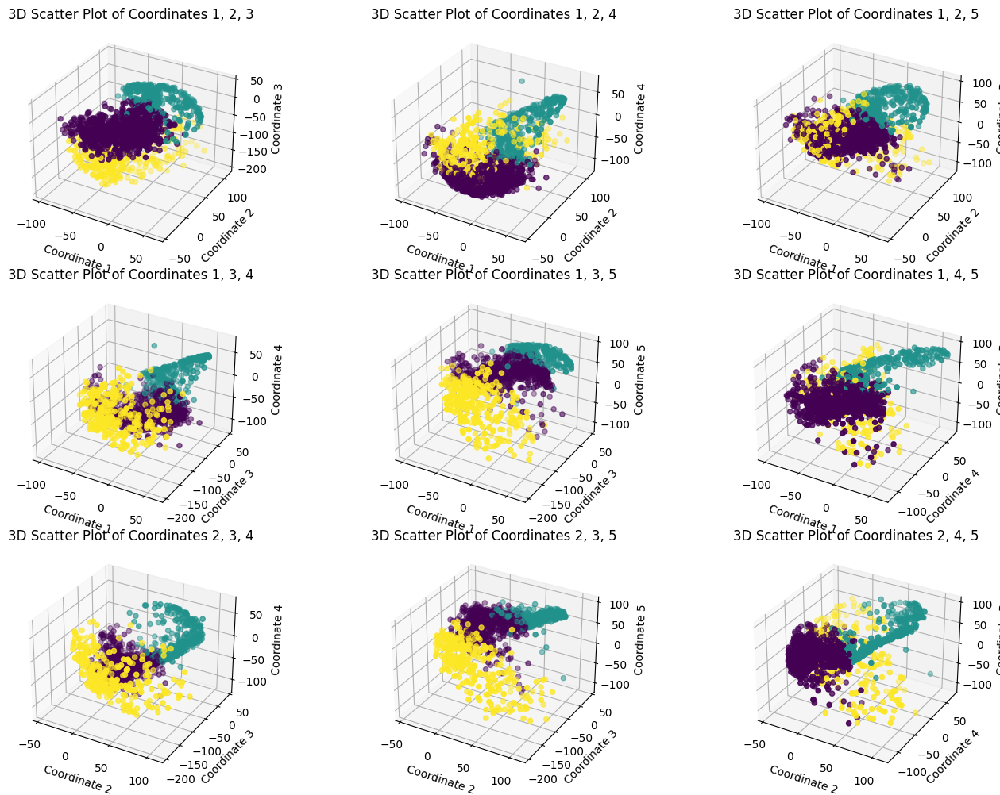

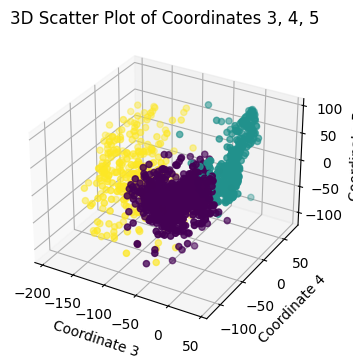

In [244]:
kmeans3 = KMeans(n_clusters=3, random_state=205).fit(encoded2)

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                scatter = ax.scatter(preds2[:, x], preds2[:, y], preds2[:, z], c=kmeans3.labels_, cmap='viridis')
                ax.set_xlabel(f'Coordinate {x+1}')
                ax.set_ylabel(f'Coordinate {y+1}')
                ax.set_zlabel(f'Coordinate {z+1}')
                ax.set_title(f'3D Scatter Plot of Coordinates {x+1}, {y+1}, {z+1}')

        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure

Finding Durations: 100%|█████████████████████| 293/293 [00:08<00:00, 36.14GRB/s]


Text(0, 0.5, 'Number of GRBs')

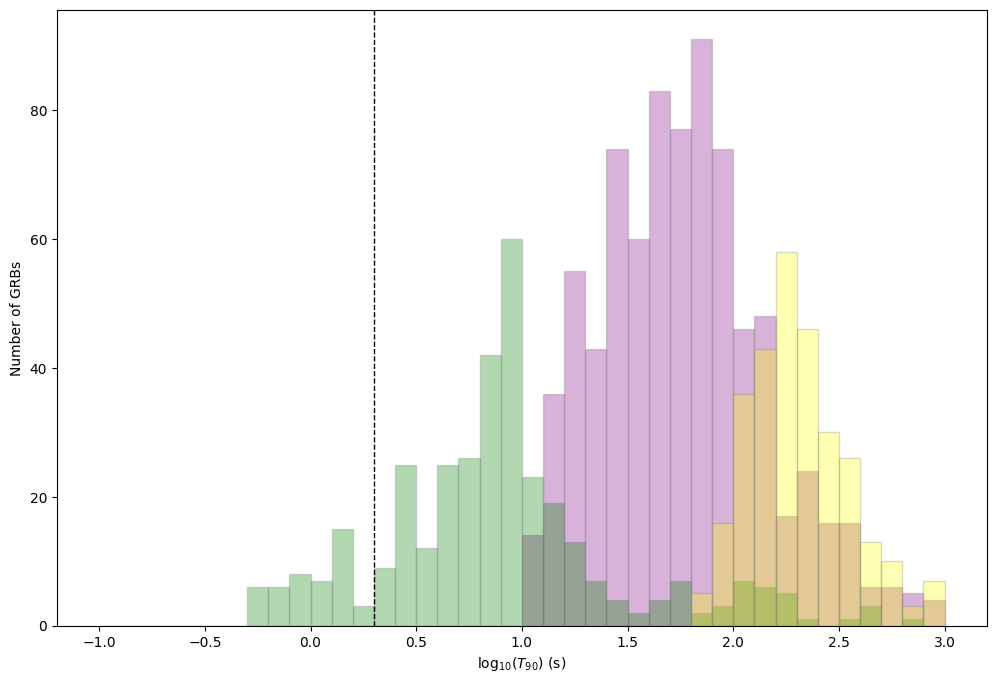

In [245]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
match1 = kmeans3.labels_==0
match2 = kmeans3.labels_==1
match3 = kmeans3.labels_==2
names1 = names_64ms[match1]
names2 = names_64ms[match2]
names3 = names_64ms[match3]
swift.duration_histogram(names=[names1, names2, names3], alpha=0.3, color_groups=['purple', 'green', 'yellow'], ax=ax)
ax.axvline(x=np.log10(2), c='k', ls='--', linewidth=1)
ax.set_xlabel(r'log$_{10}(T_{90})$ (s)')
ax.set_ylabel('Number of GRBs')